In [9]:
import os, sys
my_path = os.getcwd()+"/.."
print(my_path)
sys.path.append(my_path)

from IPython.display import HTML

import tempfile
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline


#Ensembler
##COde
from ensembler.potentials.OneD import harmonicOscillator
from ensembler.integrator.stochastic import monteCarloIntegrator, metropolisMonteCarloIntegrator
from ensembler.integrator.newtonian import positionVerletIntegrator #, leapFrogIntegrator
from ensembler.system import system

##Visualisation
from ensembler.visualisation.plotSimulations import static_sim_plots
from ensembler.visualisation.animationSimulation import animation_trajectory, animation_EDS_trajectory


C:\Users\benja\AppData\Local\Temp/..


# Executing Simulations

## Stochastic Integrators

### Metropolis 

In [22]:
#super easy Metropolis_MonteCarlo simulation
#settings
space_range = [-10, 10]
sim_steps=100

##Simulation Setup
pot=harmonicOscillator(k=2)
integrator = monteCarloIntegrator() 
sys=system(potential=pot, integrator=integrator,  position=0)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True) #500000, withdrawTraj=True)
print()
print("last_state: ", cur_state)
print(len(sys.trajectory))

sys.trajectory.head()


Simulation: 100%|██████████| 100/100 [00:00<00:00, 167.47it/s]
last_state:  State(position=-5.541506529607289, temperature=nan, totEnergy=30.708294617680217, totPotEnergy=30.708294617680217, totKinEnergy=nan, dhdpos=0.43384205676294163, velocity=nan)
101



,position,temperature,totEnergy,totPotEnergy,totKinEnergy,dhdpos,velocity
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.737267,NaN,0.543562,0.543562,NaN,-0.737267,NaN
2,-0.260908,NaN,0.068073,0.068073,NaN,0.476358,NaN
3,0.123303,NaN,0.015204,0.015204,NaN,0.384211,NaN
4,0.399023,NaN,0.159220,0.159220,NaN,0.275720,NaN


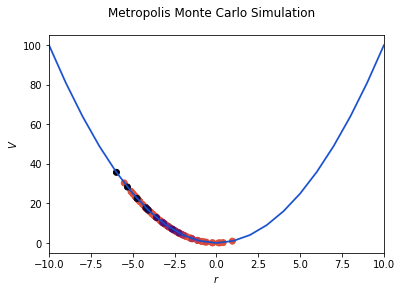

In [23]:

#plot simulation
ani, out_path = animation_trajectory(sys, x_range=space_range, title="Metropolis Monte Carlo Simulation")

##put it into jupyter:

os.chdir(tempfile.gettempdir())
HTML(ani.to_jshtml())

(None, <Figure size 1152x288 with 3 Axes>)

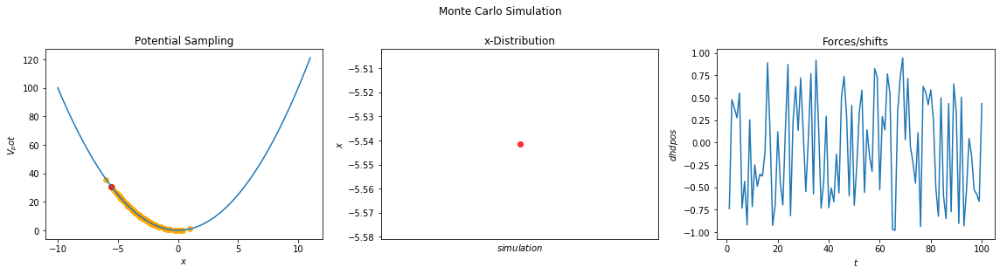

In [24]:
#static plot
static_sim_plots(sys, title="Monte Carlo Simulation", x_range=list(range(-10,11)))

### Metropolis Monte Carlo

In [19]:
#super easy Metropolis_MonteCarlo simulation
#settings
space_range = [-10, 10]
sim_steps=100
pot=harmonicOscillator(k=2)
integrator = metropolisMonteCarloIntegrator(randomnessIncreaseFactor=5) 
sys=system(potential=pot, integrator=integrator,  position=9)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True) #500000, withdrawTraj=True)
print()
print("last_state: ", cur_state)
print(len(sys.trajectory))
sys.trajectory.head()


Simulation: 100%|██████████| 100/100 [00:00<00:00, 255.45it/s]
last_state:  State(position=0.00238468947153192, temperature=nan, totEnergy=5.686743875635188e-06, totPotEnergy=5.686743875635188e-06, totKinEnergy=nan, dhdpos=0.017387448234722824, velocity=None)
101



,position,temperature,totEnergy,totPotEnergy,totKinEnergy,dhdpos,velocity
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,9.856669,NaN,97.153930,97.153930,NaN,0.856669,NaN
2,9.583889,NaN,91.850920,91.850920,NaN,-0.272781,NaN
3,8.701365,NaN,75.713758,75.713758,NaN,-0.882523,NaN
4,7.753801,NaN,60.121428,60.121428,NaN,-0.947564,NaN


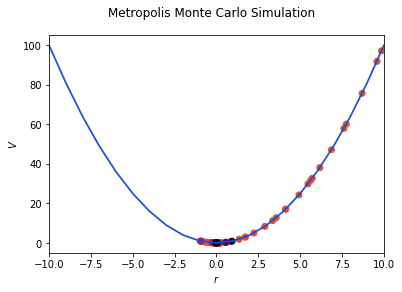

In [20]:
#plot
ani, out_path = animation_trajectory(sys, x_range=space_range, title="Metropolis Monte Carlo Simulation")

##put it into jupyter:
os.chdir(tempfile.gettempdir())
HTML(ani.to_jshtml())


(None, <Figure size 1152x288 with 3 Axes>)

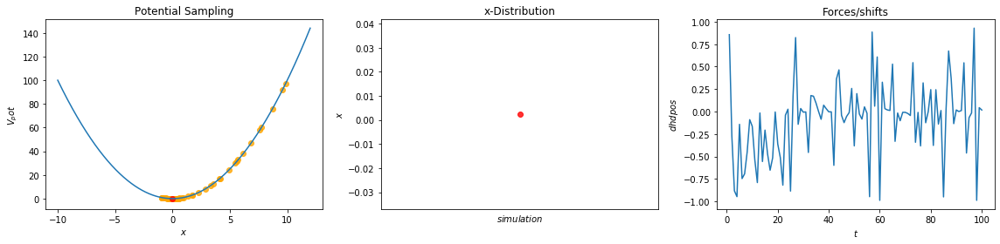

In [21]:
#plot
static_sim_plots(sys, x_range=[-10,11])

## Newtonian Integrators

### Position Verlet

In [28]:
#Simple Verlet integration simulation:
#UNDER DEVELOPMENT!The temperature is not constant!!! -- BUGGY!
#settings
sim_steps = 200
x_min, x_max = (-10, 10)
max_step_size = 2.0

#Simulation Setup
pot=harmonicOscillator()
integrator = positionVerletIntegrator(dt=0.1)
sys=system(potential=pot, integrator=integrator, position=-7.5)

#simulate
cur_state = sys.simulate(sim_steps, withdrawTraj=True, initSystem=False)

print("Trajectory length: ",len(sys.trajectory))


Simulation: 100%|██████████| 200/200 [00:00<00:00, 271.49it/s]Trajectory length:  201



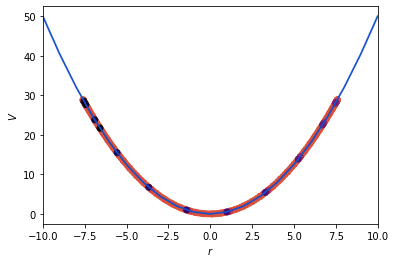

In [26]:
#animation
ani, out_path = animation_trajectory(sys, [x_min, x_max])

os.chdir(tempfile.gettempdir())
HTML(ani.to_jshtml())

(None, <Figure size 1152x288 with 3 Axes>)

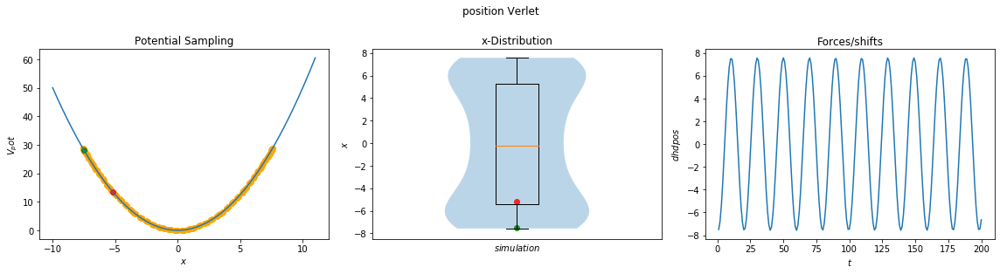

In [29]:

#plot
static_sim_plots(sys, title="position Verlet", x_range=list(range(-10,11)))